In [30]:
import wandb


In [2]:
wandb.login(relogin=True)

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:wandb: Appending key for api.wandb.ai to your netrc file: /home/vijay/.netrc


True

In [31]:
wandb.init(project="CV_assignment",name="1_q2")

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: ash003. Use `wandb login --relogin` to force relogin


In [2]:
import torch 
import torch.utils.data as data 
from torch.utils.data import DataLoader
import glob
import os 
from PIL import Image 
import re
from torchvision import transforms as T
from matplotlib import pyplot as plt 
import numpy as np 
import cv2
import random
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import pandas as pd
import openpyxl
import torch.nn as nn 
import torchvision.models as models
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix

In [3]:
transform1 = T.Compose([T.ToTensor()])

In [4]:
if torch.cuda.is_available():
    device = torch.device("cuda")
    print("CUDA is available. Using GPU.")
else:
    device = torch.device("cpu")
    print("CUDA is not available. Using CPU.")

CUDA is available. Using GPU.


In [5]:
class_mapping = {
    "amur_leopard": 0,
    "amur_tiger": 1,
    "birds": 2,
    "black_bear": 3,
    "brown_bear": 4,
    "dog": 5,
    "roe_deer": 6,
    "sika_deer": 7,
    "wild_boar": 8,
    "people": 9,
}


In [6]:
Path = "/home/vijay/Dataset/aditya_test"

In [7]:
DataPath = os.path.join(Path,"data")

In [8]:
class_data_paths = os.listdir(DataPath)

In [9]:
class_data_paths

['roe_deer',
 'amur_tiger',
 'black_bear',
 'wild_boar',
 'people',
 'dog',
 'amur_leopard',
 'birds',
 'sika_deer',
 'brown_bear']

In [10]:
df = pd.DataFrame()

In [11]:
for clss in class_data_paths : 
    c = os.listdir(os.path.join(DataPath,clss))
    c = [f"{DataPath}/{clss}/{path}" for path in c  ]
    class_df = pd.DataFrame({'Image_path' : c , 'Label' : class_mapping[clss], 'Class' : clss})
    df = pd.concat([df,class_df],ignore_index=True)


In [12]:
df.to_excel('data.xlsx',index=False,header=True)

In [13]:
a = pd.read_excel('data.xlsx')

In [14]:
a['Image_path'][0]

'/home/vijay/Dataset/aditya_test/data/roe_deer/0431_rd_n_crop00_detections.jpg'

In [15]:
train_img , test_img_tmp , train_labels, test_labels_tmp = train_test_split(a['Image_path'],
                                                                     a['Label'],
                                                                     test_size=0.3,
                                                                     random_state=3)

In [16]:
train_df = pd.DataFrame({'Image_path' : train_img , 'Label' : train_labels})
train_df.to_excel('train_data.xlsx',index=False,header=True)

In [17]:
test_img, val_img,  test_labels ,  val_labels = train_test_split( test_img_tmp,
                                                                     test_labels_tmp,
                                                                     test_size=0.1,
                                                                     random_state=3)

In [18]:
test_df = pd.DataFrame({'Image_path' : test_img , 'Label' : test_labels})
test_df.to_excel('test_data.xlsx',index=False,header=True)

val_df = pd.DataFrame({'Image_path' : val_img , 'Label' : val_labels})
val_df.to_excel('val_data.xlsx',index=False,header=True)

In [19]:
train_class_dict = {key: 0 for key in class_mapping.values() }
test_class_dict = {key: 0 for key in class_mapping.values() }
val_class_dict = {key: 0 for key in class_mapping.values() }

In [20]:
for val in train_df['Label'] :
    train_class_dict[val] += 1

for val in test_df['Label'] :
    test_class_dict[val] += 1

for val in val_df['Label'] :
    val_class_dict[val] += 1

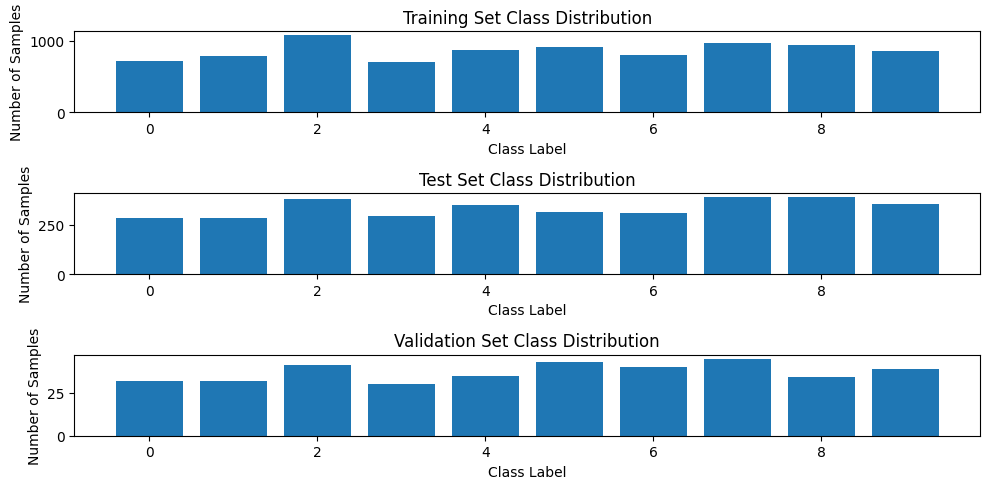

In [21]:
# Plotting
plt.figure(figsize=(10, 5))

plt.subplot(3, 1, 1)
plt.bar(train_class_dict.keys(), train_class_dict.values())
plt.title('Training Set Class Distribution')
plt.xlabel('Class Label')
plt.ylabel('Number of Samples')

plt.subplot(3, 1, 2)
plt.bar(test_class_dict.keys(), test_class_dict.values())
plt.title('Test Set Class Distribution')
plt.xlabel('Class Label')
plt.ylabel('Number of Samples')

plt.subplot(3, 1, 3)
plt.bar(val_class_dict.keys(), val_class_dict.values())
plt.title('Validation Set Class Distribution')
plt.xlabel('Class Label')
plt.ylabel('Number of Samples')

plt.tight_layout()
plt.show()

In [22]:
class dataloader(data.Dataset) : 
    def __init__(self,data_xl):
        super(dataloader,self).__init__()  
        self.data_img = []
        self.data_labels = []
        xl = pd.read_excel(data_xl)
        for i in range(xl.shape[0]) : 
            self.data_img.append( xl['Image_path'][i] )
            self.data_labels.append( xl['Label'][i] )

    
    def __getitem__(self, index):
        img_path = self.data_img[index]
        img = Image.open(img_path).resize((224,224))
        timg = transform1(img)
        label = self.data_labels[index]

        return timg , label 
    
    def __len__(self) : 
        return len(self.data_img)

In [23]:
valPath = os.path.join(Path,"val_data.xlsx")

In [24]:
dval = dataloader(valPath)

In [25]:
data_val = DataLoader(dval,batch_size=1,shuffle=False)
i= 0 
for batch in data_val : 
    img , label = batch 
    print(f"img shape : {img.shape} | label : {label}")
    i += 1
    if(i==10):
        break 

img shape : torch.Size([1, 3, 224, 224]) | label : tensor([7])
img shape : torch.Size([1, 3, 224, 224]) | label : tensor([9])
img shape : torch.Size([1, 3, 224, 224]) | label : tensor([2])
img shape : torch.Size([1, 3, 224, 224]) | label : tensor([3])
img shape : torch.Size([1, 3, 224, 224]) | label : tensor([6])
img shape : torch.Size([1, 3, 224, 224]) | label : tensor([4])
img shape : torch.Size([1, 3, 224, 224]) | label : tensor([0])
img shape : torch.Size([1, 3, 224, 224]) | label : tensor([1])
img shape : torch.Size([1, 3, 224, 224]) | label : tensor([5])
img shape : torch.Size([1, 3, 224, 224]) | label : tensor([7])


In [26]:
class cnn_model(nn.Module):
    def __init__(self, num_classes):
        super(cnn_model, self).__init__()
        
        # Convolutional layers
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1)
        
        # Max pooling layers
        self.maxpool1 = nn.MaxPool2d(kernel_size=4, stride=4)
        self.maxpool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        
        # Fully connected layer
        self.fc = nn.Linear(128 * 14 * 14, num_classes)  # Assuming input image size 224x224
        
        # Activation function
        self.relu = nn.ReLU()
        
    def forward(self, x):
        # Convolutional layers with ReLU activation
        x = self.relu(self.conv1(x))
        x = self.maxpool1(x)
        
        x = self.relu(self.conv2(x))
        x = self.maxpool2(x)
        
        x = self.relu(self.conv3(x))
        x = self.maxpool2(x)
        
        # Flatten the output
        x = x.view(x.size(0), -1)
        
        # Fully connected layer
        x = self.fc(x)        
        return x


In [27]:
config = dict(
    epochs=10,
    classes=10,
    batch_size=32,
    lr=0.001,
)

In [32]:
config = wandb.config

In [33]:
epochs=10,
classes=10,
batch_size=32,
lr=0.001,

In [34]:
cnn_model = cnn_model(10)
cnn_model = cnn_model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(cnn_model.parameters(), lr=0.001)

In [35]:
trainPath = os.path.join(Path,"train_data.xlsx") 
testPath = os.path.join(Path,"test_data.xlsx")
valPath = os.path.join(Path,"val_data.xlsx")

dtrain = dataloader(trainPath)
data_train = DataLoader(dtrain,batch_size=32,shuffle=True)

dtest = dataloader(testPath)
data_test = DataLoader(dtest,batch_size=32,shuffle=True)

dval = dataloader(valPath)
data_val = DataLoader(dval,batch_size=32,shuffle=False)


In [36]:
len(dtrain)

8642

In [37]:
def get_output(model,img,label) : 
    img = img.to(device)
    label = label.to(device)
    output = model(img)
    loss = criterion(output,label)
    return output,loss,img,label


In [38]:
def get_loss_accuracy(loss,correct,lent):
    tloss = loss/lent
    tacc = 100*correct/lent

    return tloss,tacc

In [39]:
for epoch in tqdm(range(epochs[0])) : 
    cnn_model = cnn_model.train()
    train_loss_epoch = 0
    correct = 0 
    val_loss = 0 
    
    i=0
    for batch in data_train : 
        optimizer.zero_grad()

        img , label = batch 
        # print(img.size(0))
        # print(batch_size)

        output, loss , img , label = get_output(cnn_model,img,label)
        
        loss.backward()
        optimizer.step()
        i += 1 
        train_loss_epoch += loss.item() /batch_size[0]
        _, predicted = torch.max(output, 1)
        predicted_dtr = predicted.to(device)
        correct += (predicted_dtr == label).sum().item()
    
    l = len(dtrain)
    train_loss , train_accuracy = get_loss_accuracy(train_loss_epoch,correct,l)

    cnn_model = cnn_model.eval()
    vald_loss = 0 
    vald_correct = 0

    with torch.no_grad():
        iv = 0 
        for batch in data_val : 
            img_v , label_v = batch 
            
            output_val , loss, img_v , label_v = get_output(cnn_model,img_v,label_v)
            iv += 1

            val_loss += loss.item()
            _, predicted = torch.max(output_val, 1)
            predicted_dv = predicted.to(device)
            vald_correct += (predicted_dv == label_v).sum().item()

    l_v = len(dval)
    val_loss , val_accuracy = get_loss_accuracy(val_loss,vald_correct,l_v)

    wandb.log({
    'epoch': epoch + 1,
    'train_loss': train_loss_epoch,
    'train_accuracy': train_accuracy,
    'val_loss': val_loss,
    'val_accuracy': val_accuracy
})
    
    print(f"Epoch : {epoch} | Train loss : {train_loss_epoch:.3f} | Train Acc : {train_accuracy:.3f} | Val acc. {val_accuracy:.2f}")
    

torch.save(cnn_model.state_dict(), os.path.join(Path,f"2_.pkl"))



# torch.onnx.export(
#             model,
#             images,
#             "part2.onnx",
#             input_names=["input"],
#             output_names=["output"],
#             dynamic_axes={
#                 "input": {0: "batch_size"},
#                 "output": {0: "batch_size"},
#             },
#         )
# wandb.save("part2.onnx")

# # Finish logging
# wandb.finish()



 10%|█         | 1/10 [00:58<08:50, 58.93s/it]

Epoch : 0 | Train loss : 16.375 | Train Acc : 30.305 | Val acc. 38.27


 20%|██        | 2/10 [01:56<07:47, 58.40s/it]

Epoch : 1 | Train loss : 12.834 | Train Acc : 48.230 | Val acc. 50.40


 30%|███       | 3/10 [02:54<06:47, 58.18s/it]

Epoch : 2 | Train loss : 10.525 | Train Acc : 58.551 | Val acc. 58.49


 40%|████      | 4/10 [03:52<05:47, 58.00s/it]

Epoch : 3 | Train loss : 8.908 | Train Acc : 65.297 | Val acc. 56.87


 50%|█████     | 5/10 [04:50<04:50, 58.03s/it]

Epoch : 4 | Train loss : 7.756 | Train Acc : 69.984 | Val acc. 60.11


 60%|██████    | 6/10 [05:48<03:52, 58.13s/it]

Epoch : 5 | Train loss : 6.353 | Train Acc : 75.214 | Val acc. 60.65


 70%|███████   | 7/10 [06:46<02:54, 58.09s/it]

Epoch : 6 | Train loss : 5.069 | Train Acc : 80.398 | Val acc. 61.99


 80%|████████  | 8/10 [07:45<01:56, 58.14s/it]

Epoch : 7 | Train loss : 3.996 | Train Acc : 84.772 | Val acc. 62.53


 90%|█████████ | 9/10 [08:43<00:58, 58.22s/it]

Epoch : 8 | Train loss : 3.261 | Train Acc : 87.908 | Val acc. 59.84


100%|██████████| 10/10 [09:41<00:00, 58.17s/it]

Epoch : 9 | Train loss : 2.681 | Train Acc : 89.759 | Val acc. 58.22


Testing the model 

In [40]:
def get_output(model,img,label,to_test = False) : 
    if to_test == False :
        img = img.to(device)
        label = label.to(device)
        output = model(img)
        loss = criterion(output,label)
        return output,loss,img,label
    else : 
        img = img.to(device)
        label = label.to(device)
        output = model(img)
        return output,img,label



In [41]:
def test_log(true_labels,pred_labels):
    accuracy = accuracy_score(true_labels, pred_labels)
    f1 = f1_score(true_labels, pred_labels, average='macro')

    # Calculate confusion matrix
    conf_matrix = confusion_matrix(true_labels, pred_labels)

    # Log accuracy and F1-score to WandB
    wandb.log({'test_accuracy': accuracy, 'test_f1_score': f1})

    # Log confusion matrix to WandB
    wandb.log({"confusion_matrix": wandb.plot.confusion_matrix(probs=None,
                                                                y_true=np.array(true_labels),
                                                                preds=np.array(pred_labels),
                                                                class_names=[str(i) for i in range(10)])})

    return accuracy , f1

    

In [42]:
true_labels = []
pred_labels = []

cnn_model = cnn_model.eval()

with torch.no_grad():
    for batch in data_test:

        images, labels = batch 
        outputs,images,labels = get_output(cnn_model,images,labels,to_test=True)

        _, predicted = torch.max(outputs, 1)
        
        true_labels.extend(labels.cpu().numpy())
        pred_labels.extend(predicted.cpu().numpy())


# Calculate accuracy and F1-score
acc , f1 = test_log(true_labels,pred_labels)

# Print accuracy and F1-score
print(f'Test Accuracy: {acc*100:.4f}')
print(f'Test F1-Score: {f1*100:.4f}')




Test Accuracy: 62.5075
Test F1-Score: 62.3726


In [103]:
class_miss_viz = {key: [] for key in class_mapping.values()}
class_miss_pred = {key: [] for key in class_mapping.values()}

In [104]:
cnn_model = cnn_model.eval()

In [105]:
data_test_viz = DataLoader(dtest,batch_size=1,shuffle=True)

In [106]:
i = 0 
with torch.no_grad()  :
    for batch in data_test_viz :
        img , label = batch 
        output,img,label = get_output(cnn_model,img,label,to_test=True)
        _, predicted = torch.max(output, 1)
        predicted_dtr = predicted.to(device)
        
        if(predicted.item() != label.item() and len(class_miss_viz[label.item()]) < 3 ) :
            class_miss_viz[label.item()].append(img.detach().cpu().numpy()) 
            class_miss_pred[label.item()].append(predicted.item()) 
            i += 1
        
        if(i == 30):
            break 
        

In [109]:
len(class_miss_viz[0])

3

In [110]:
len(class_miss_pred[0])

3

In [111]:
class_miss_pred[0]

[1, 6, 1]

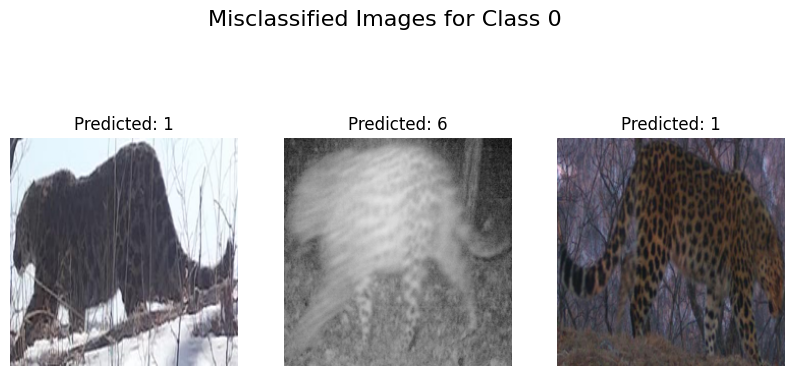

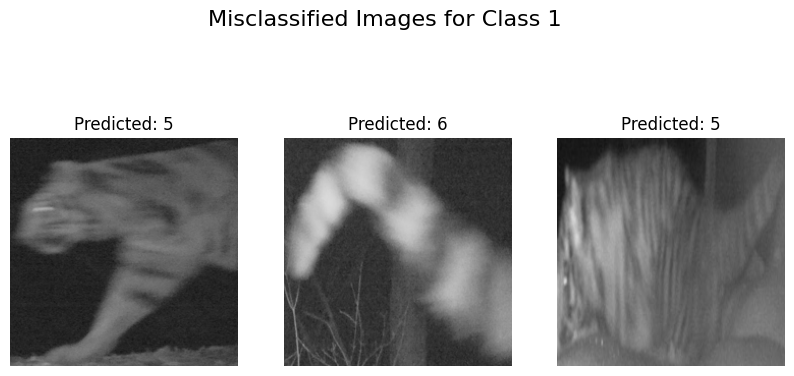

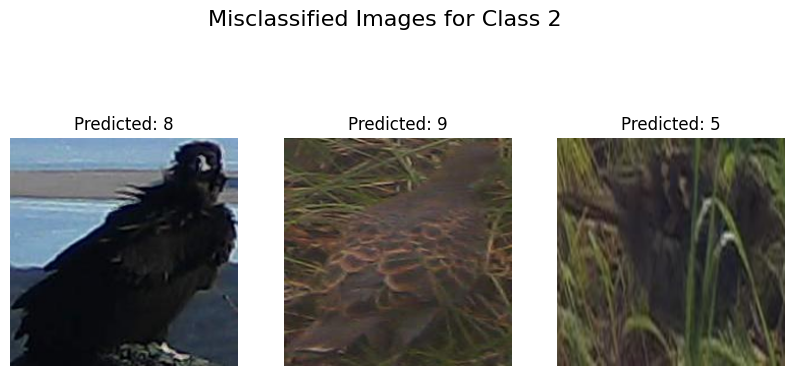

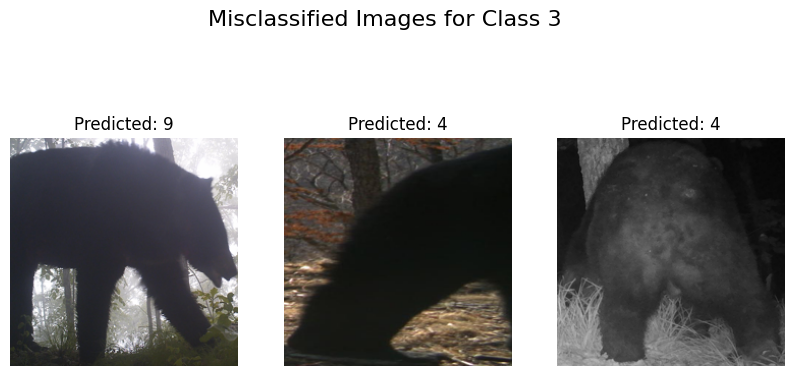

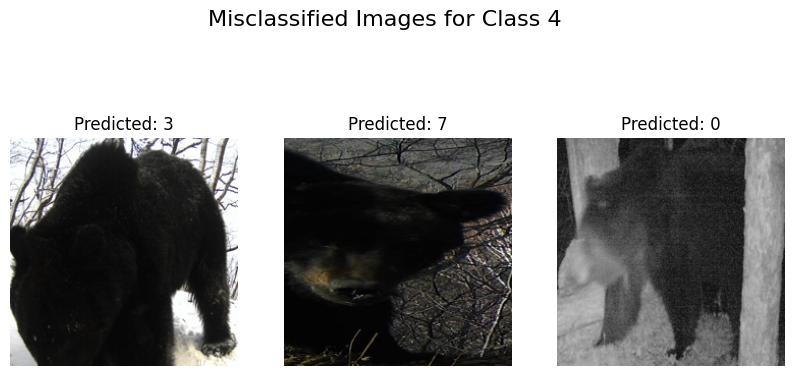

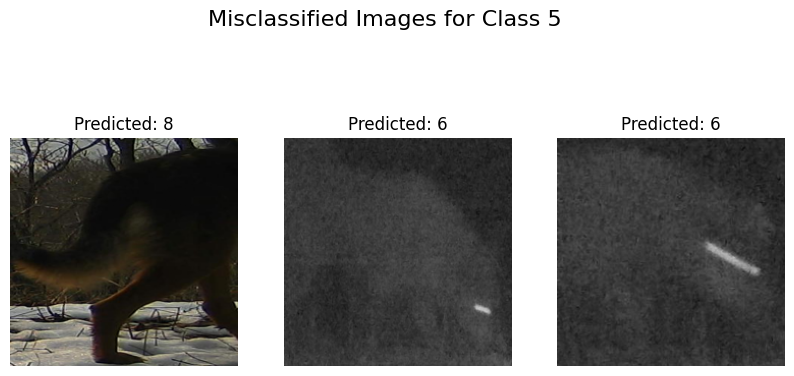

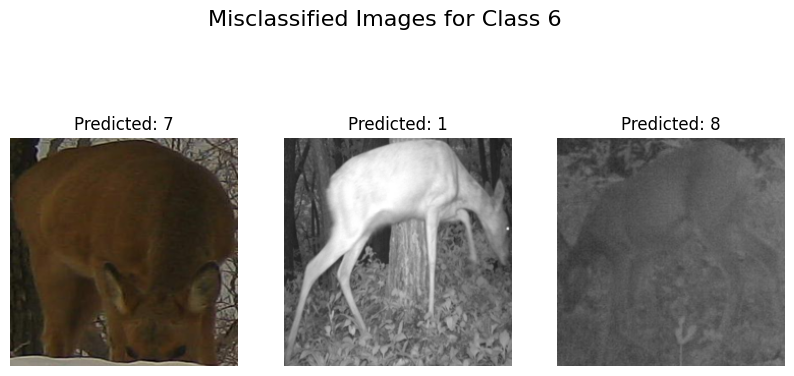

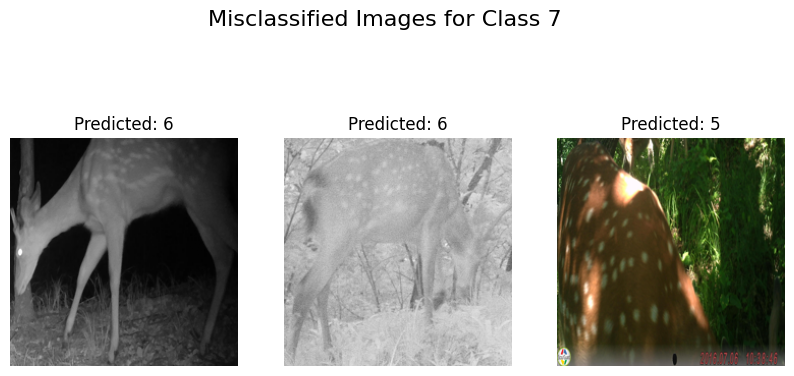

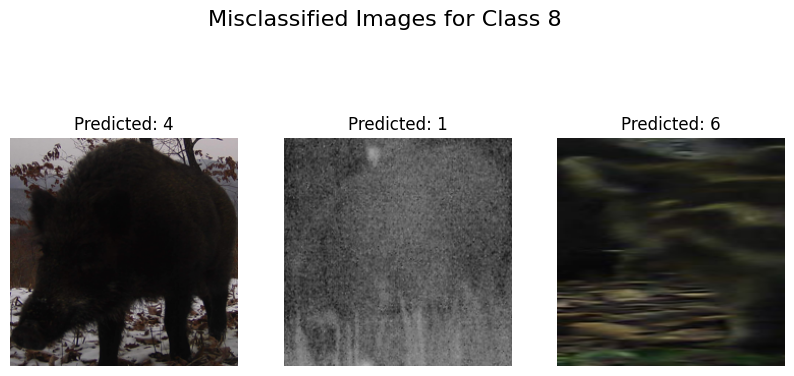

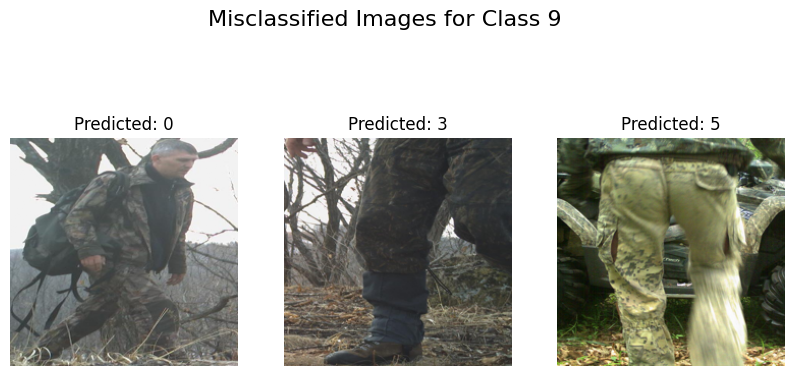

In [113]:
def display_misclassified_images(class_name, misclassified_images):
    plt.figure(figsize=(10, 5))
    plt.suptitle(f'Misclassified Images for Class {class_name}', fontsize=16)

    for i, image in enumerate(misclassified_images, 1):
        image = np.squeeze(image,axis=0)
        image = image.transpose((1, 2, 0))   
        
        plt.subplot(1, 3, i)
        plt.imshow(image)
        plt.title(f'Predicted: {class_miss_pred[class_name][i-1]}')
        plt.axis('off')

    plt.show()

# Loop through each class and display misclassified images
for class_name, misclassified_images in class_miss_viz.items():
    display_misclassified_images(class_name, misclassified_images)

In [ ]:
for key in class_miss_viz : 
    for img in class_miss_viz[key] :
        

In [58]:
# Save the model in the exchangeable ONNX format
wandb.save(f"{Path}/2_.pkl")

# Finish logging
wandb.finish()

wandb: WARNING Saving files without folders. If you want to preserve sub directories pass base_path to wandb.save, i.e. wandb.save("/mnt/folder/file.h5", base_path="/mnt")


epoch,▁▂▃▃▄▅▆▆▇█
test_accuracy,▁
test_f1_score,▁
train_accuracy,▁▂▄▅▅▆▇███
train_loss,█▇▅▄▄▃▂▂▁▁
val_accuracy,▁▄▅▆▇▇█▆▇█
val_loss,▄▂▂▁▂▄▄▆██
epoch,10
test_accuracy,0.65627
test_f1_score,0.65582
train_accuracy,94.14487


Fine tunning pretrained Resnet-18

In [2]:
wandb.init(project="CV_assignment_resnet18",name="1_q3_pretrained")

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: ash003. Use `wandb login --relogin` to force relogin


In [123]:
# trainPath = os.path.join(Path,"train_data.xlsx") 
# testPath = os.path.join(Path,"test_data.xlsx")
# valPath = os.path.join(Path,"val_data.xlsx")

trainPath = '/home/vijay/Dataset/aditya_test/test_data.xlsx'
testPath = '/home/vijay/Dataset/aditya_test/test_data.xlsx'
valPath = '/home/vijay/Dataset/aditya_test/val_data.xlsx'


dtrain = dataloader(trainPath)
data_train = DataLoader(dtrain,batch_size=32,shuffle=True)

dtest = dataloader(testPath)
data_test = DataLoader(dtest,batch_size=32,shuffle=True)

dval = dataloader(valPath)
data_val = DataLoader(dval,batch_size=32,shuffle=False)


In [100]:
# pretrained_model = models.resnet18(pretrained=True)
pretrained_model = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)

In [101]:
for parameters in pretrained_model.parameters():
    parameters.requires_grad = False

In [102]:
pretrained_model.fc = nn.Linear(pretrained_model.fc.in_features, classes[0])

In [103]:
pretrained_model = pretrained_model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(pretrained_model.parameters(), lr=0.001)

In [56]:
for epoch in tqdm(range(epochs[0])):
    pretrained_model.train()
    train_loss_epoch = 0.0
    train_correct = 0
    
    i=0
    for batch in data_train:
        optimizer.zero_grad()
        images, labels = batch 

        outputs, loss , images , labels = get_output(pretrained_model,images,labels)         
        loss.backward()
        optimizer.step()
        i += 1
        train_loss_epoch += loss.item() / batch_size[0]
        _, predicted = torch.max(outputs, 1)
        train_correct += (predicted == labels).sum().item()
    
    # Calculate average training loss and accuracy
    l = len(dtrain)
    train_loss , train_accuracy = get_loss_accuracy(train_loss_epoch,train_correct,l)
    
    # Validation loop
    pretrained_model = pretrained_model.eval()
    val_loss = 0.0
    vald_correct = 0
    
    with torch.no_grad():
        iv = 0 
        for batch in data_val : 
            img_v , label_v = batch 
            
            output_val , img_v , label_v = get_output(pretrained_model,img_v,label_v,to_test=True)
            iv += 1
            val_loss += loss.item() / batch_size[0]
            _, predicted = torch.max(output_val, 1)
            predicted_dv = predicted.to(device)
            vald_correct += (predicted_dv == label_v).sum().item()
    
    l_v = len(dval)
    val_loss , val_accuracy = get_loss_accuracy(val_loss,vald_correct,l_v)
    
    # Log training and validation metrics to WandB
    wandb.log({
    'epoch': epoch + 1,
    'train_loss': train_loss_epoch,
    'train_accuracy': train_accuracy,
    'val_loss': val_loss,
    'val_accuracy': val_accuracy
})
    
    # Print training and validation metrics
    print(f"Epoch : {epoch} | Train loss : {train_loss_epoch:.3f} | Train Acc : {train_accuracy:.3f} | Val acc. {val_accuracy:.2f}")

torch.save(pretrained_model.state_dict(), os.path.join("/home/vijay/Dataset/aditya_test",f"3_.pkl"))


 10%|█         | 1/10 [00:24<03:38, 24.31s/it]

Epoch : 0 | Train loss : 2.894 | Train Acc : 71.956 | Val acc. 74.39


 20%|██        | 2/10 [00:48<03:14, 24.27s/it]

Epoch : 1 | Train loss : 2.576 | Train Acc : 74.055 | Val acc. 76.55


 30%|███       | 3/10 [01:12<02:49, 24.18s/it]

Epoch : 2 | Train loss : 2.365 | Train Acc : 76.785 | Val acc. 76.01


 40%|████      | 4/10 [01:36<02:24, 24.14s/it]

Epoch : 3 | Train loss : 2.205 | Train Acc : 78.764 | Val acc. 76.28


 50%|█████     | 5/10 [02:00<02:00, 24.12s/it]

Epoch : 4 | Train loss : 2.138 | Train Acc : 78.494 | Val acc. 77.63


 60%|██████    | 6/10 [02:24<01:36, 24.09s/it]

Epoch : 5 | Train loss : 2.014 | Train Acc : 79.724 | Val acc. 78.44


 70%|███████   | 7/10 [02:48<01:12, 24.09s/it]

Epoch : 6 | Train loss : 1.911 | Train Acc : 80.714 | Val acc. 77.63


 80%|████████  | 8/10 [03:12<00:47, 23.96s/it]

Epoch : 7 | Train loss : 1.873 | Train Acc : 80.954 | Val acc. 78.98


 90%|█████████ | 9/10 [03:36<00:23, 23.98s/it]

Epoch : 8 | Train loss : 1.847 | Train Acc : 81.224 | Val acc. 78.71


100%|██████████| 10/10 [04:00<00:00, 24.04s/it]

Epoch : 9 | Train loss : 1.784 | Train Acc : 82.454 | Val acc. 77.36


In [182]:
wandb.finish()

epoch,▁▂▁▁▂▃▃▄▅▆▆▇█
train_accuracy,▇█▁▆▆▇▇▇▇████
train_loss,▁▁▁█▇▇▆▆▆▆▆▅▅
val_accuracy,█▇▁▅▆▆▆▇█▇██▇
val_loss,▂▅██▂▇▆▇▁▃▄▃▃
epoch,10
train_accuracy,82.45351
train_loss,1.7838
val_accuracy,77.35849
val_loss,0.00042


In [125]:
wandb.init(project="CV_assignment_2_pretrained",name="test_result")

In [126]:
pretrained_model = models.resnet18()
pretrained_model.fc = nn.Linear(pretrained_model.fc.in_features, classes[0])
loaded_model = torch.load('/home/vijay/Dataset/aditya_test/3_.pkl')
pretrained_model.load_state_dict(loaded_model)


<All keys matched successfully>

In [127]:
true_labels = []
pred_labels = []

pretrained_model = pretrained_model.to(device)
pretrained_model = pretrained_model.eval()

with torch.no_grad():
    for batch in data_test:

        images, labels = batch 
        outputs,images,labels = get_output(pretrained_model,images,labels,to_test=True)

        _, predicted = torch.max(outputs, 1)
        
        true_labels.extend(labels.cpu().numpy())
        pred_labels.extend(predicted.cpu().numpy())


# Calculate accuracy and F1-score
acc , f1 = test_log(true_labels,pred_labels)

# Print accuracy and F1-score
print(f'Test Accuracy: {acc*100:.4f}')
print(f'Test F1-Score: {f1*100:.4f}')


Test Accuracy: 84.9430
Test F1-Score: 84.9598


In [134]:
from sklearn.manifold import TSNE 

pretrained_model = pretrained_model.eval()

features = []
labels_f = []

with torch.no_grad() : 
    for batch in data_train : 
        images , labels = batch 
        outputs,images,labels = get_output(pretrained_model,images,labels,to_test=True)
        out_np = outputs.cpu().numpy()
        label_np = labels.cpu().numpy()
        # features.extend(out_np)
        # labels_f.extend(label_np)
        features.append(out_np)
        labels_f.append(label_np)
        
    for batch in data_val : 
        images , labels = batch 
        outputs,images,labels = get_output(pretrained_model,images,labels,to_test=True)
        out_np = outputs.cpu().numpy()
        label_np = labels.cpu().numpy()
        # features.extend(out_np)
        # labels_f.extend(label_np)
        features.append(out_np)
        labels_f.append(label_np)
        
features = np.concatenate(features)
labels_f = np.concatenate(labels_f)


tsne = TSNE(n_components=2,random_state=3)
tsne1 = tsne.fit_transform(features)

In [152]:
import plotly.express as px


In [147]:
import plotly.express as px
import plotly.graph_objects as go

# Visualize t-SNE in 2D
tsne_df_2d = pd.DataFrame({'TSNE1': tsne1[:, 0], 'TSNE2': tsne1[:, 1], 'Label': labels_f})
tsne_df_2d.to_csv('2d_tsne.csv')

fig_2d = px.scatter(tsne_df_2d, x='TSNE1', y='TSNE2', color='Label', title='t-SNE Plot in 2D')
fig_2d.update_layout(title='t-SNE Plot in 2D')

# fig_2d.show()




ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'hovertemplate': 'TSNE1=%{x}<br>TSNE2=%{y}<br>Label=%{marker.color}<extra></extra>',
              'legendgroup': '',
              'marker': {'color': array([6, 1, 8, ..., 3, 7, 7]), 'coloraxis': 'coloraxis', 'symbol': 'circle'},
              'mode': 'markers',
              'name': '',
              'showlegend': False,
              'type': 'scattergl',
              'x': array([  8.554731,  23.834696,  42.007904, ...,  53.096233, -17.898169,
                           23.015781], dtype=float32),
              'xaxis': 'x',
              'y': array([-53.726017 ,  21.716843 , -21.498203 , ...,  -1.0854522,  -6.1247497,
                          -28.835337 ], dtype=float32),
              'yaxis': 'y'}],
    'layout': {'coloraxis': {'colorbar': {'title': {'text': 'Label'}},
                             'colorscale': [[0.0, '#0d0887'], [0.1111111111111111,
                                            '#46039f'], [0.2222222222222222,
                                            '#7201a8'], [0.3333333333333333,
                                            '#9c179e'], [0.4444444444444444,
                                            '#bd3786'], [0.5555555555555556,
                                            '#d8576b'], [0.6666666666666666,
                                            '#ed7953'], [0.7777777777777778,
                                            '#fb9f3a'], [0.8888888888888888,
                                            '#fdca26'], [1.0, '#f0f921']]},
               'legend': {'tracegroupgap': 0},
               'template': '...',
               'title': {'text': 't-SNE Plot in 2D'},
               'xaxis': {'anchor': 'y', 'domain': [0.0, 1.0], 'title': {'text': 'TSNE1'}},
               'yaxis': {'anchor': 'x', 'domain': [0.0, 1.0], 'title': {'text': 'TSNE2'}}}
})

In [149]:
# # Visualize t-SNE in 3D
tsne = TSNE(n_components=3, random_state=3)
tsne3 = tsne.fit_transform(features)

tsne_df_3d = pd.DataFrame({'TSNE1': tsne3[:, 0], 'TSNE2': tsne3[:, 1], 'TSNE3': tsne3[:, 2], 'Label': labels_f})
tsne_df_3d.to_csv('3d_tsne.csv')

fig_3d = go.Figure(data=[go.Scatter3d(x=tsne_df_3d['TSNE1'], y=tsne_df_3d['TSNE2'], z=tsne_df_3d['TSNE3'],
                                     mode='markers', marker=dict(size=5, color=tsne_df_3d['Label']))])
fig.update_traces(showlegend=True)
fig_3d.update_layout(title='t-SNE Plot in 3D')
# fig_3d.show()

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'marker': {'color': array([6, 1, 8, ..., 3, 7, 7]), 'size': 5},
              'mode': 'markers',
              'type': 'scatter3d',
              'x': array([-0.08665048, 10.036531  , 13.298119  , ..., 17.130283  , -7.268713  ,
                           3.047063  ], dtype=float32),
              'y': array([-19.741562 ,   5.321443 , -10.457514 , ...,   0.6292824,  -0.1876624,
                          -13.548283 ], dtype=float32),
              'z': array([-1.3788683 , -8.048515  ,  0.53330827, ...,  3.1908278 , -1.4408348 ,
                           1.704957  ], dtype=float32)}],
    'layout': {'template': '...', 'title': {'text': 't-SNE Plot in 3D'}}
})

In [ ]:
tsne = TSNE(n_components=3, random_state=0)  
X_tsne = tsne.fit_transform(embeds)

fig = px.scatter_3d(
    X_tsne, x=0, y=1, z=2,
    color=y,
    title='3D t-SNE Visualization'
)

fig.update_traces(marker=dict(size=5), showlegend=True)
fig.update_layout(
    width=1000,
    height=800
)

fig.show()

Data Augmentation

In [26]:
import albumentations as A

In [41]:
aug = A.Compose([
    A.VerticalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
    A.HorizontalFlip(p=1),
    A.Transpose(p=1)
])

In [42]:
c = [f"{DataPath}/{clss}" for clss  in class_data_paths ]


In [43]:
c

['/home/vijay/Dataset/aditya_test/data/roe_deer',
 '/home/vijay/Dataset/aditya_test/data/amur_tiger',
 '/home/vijay/Dataset/aditya_test/data/black_bear',
 '/home/vijay/Dataset/aditya_test/data/wild_boar',
 '/home/vijay/Dataset/aditya_test/data/people',
 '/home/vijay/Dataset/aditya_test/data/dog',
 '/home/vijay/Dataset/aditya_test/data/amur_leopard',
 '/home/vijay/Dataset/aditya_test/data/birds',
 '/home/vijay/Dataset/aditya_test/data/sika_deer',
 '/home/vijay/Dataset/aditya_test/data/brown_bear']

In [44]:
def apply_augmentation_and_save(input_image_path, output_folder, num_augmentations=4):
    # Load the input image
    image = Image.open(input_image_path).resize((224,224))
    image = np.array(image)

    # Apply augmentations and save the images
    for i in range(num_augmentations):
        augmented = aug(image=image)
        augmented_image = augmented['image']
                
        t = input_image_path
        tr = re.split('[/.]',t)

        # Save the augmented image
        output_path = os.path.join(output_folder,f"aug_{tr[7]}_{i+1}.jpg")
        print(output_path)
        cv2.imwrite(output_path, augmented_image)

In [45]:
img_paths = pd.read_excel('data.xlsx')['Image_path']    
t = img_paths[0]
tr = re.split('[/.]',t)
tr

['',
 'home',
 'vijay',
 'Dataset',
 'aditya_test',
 'data',
 'roe_deer',
 '0431_rd_n_crop00_detections',
 'jpg']

In [46]:
tr[7]+'/.jpg'

'0431_rd_n_crop00_detections/.jpg'

In [47]:
tr[7]+'/.'+tr[8]

'0431_rd_n_crop00_detections/.jpg'

In [56]:
for path in img_paths : 
    t = path
    tr = re.split('[/]',t)
    directory_path = os.path.join('/home/vijay/Dataset/aditya_test/aug_data',tr[6])
    if not os.path.exists(directory_path):
        os.makedirs(directory_path)
        print(f"Directory '{directory_path}' created.")

    apply_augmentation_and_save(path, directory_path)
    

Directory '/home/vijay/Dataset/aditya_test/aug_data/roe_deer' created.
/home/vijay/Dataset/aditya_test/aug_data/roe_deer/aug_0431_rd_n_crop00_detections_1.jpg
/home/vijay/Dataset/aditya_test/aug_data/roe_deer/aug_0431_rd_n_crop00_detections_2.jpg
/home/vijay/Dataset/aditya_test/aug_data/roe_deer/aug_0431_rd_n_crop00_detections_3.jpg
/home/vijay/Dataset/aditya_test/aug_data/roe_deer/aug_0431_rd_n_crop00_detections_4.jpg
/home/vijay/Dataset/aditya_test/aug_data/roe_deer/aug_1365_rd_n_crop01_detections_1.jpg
/home/vijay/Dataset/aditya_test/aug_data/roe_deer/aug_1365_rd_n_crop01_detections_2.jpg
/home/vijay/Dataset/aditya_test/aug_data/roe_deer/aug_1365_rd_n_crop01_detections_3.jpg
/home/vijay/Dataset/aditya_test/aug_data/roe_deer/aug_1365_rd_n_crop01_detections_4.jpg
/home/vijay/Dataset/aditya_test/aug_data/roe_deer/aug_1021_rd_n_crop00_detections_1.jpg
/home/vijay/Dataset/aditya_test/aug_data/roe_deer/aug_1021_rd_n_crop00_detections_2.jpg
/home/vijay/Dataset/aditya_test/aug_data/roe_deer

In [81]:
aug_DataPath = os.path.join(Path,"aug_data")

In [82]:
class_data_paths = os.listdir(aug_DataPath)

In [83]:
class_data_paths

['roe_deer',
 'amur_tiger',
 'black_bear',
 'wild_boar',
 'people',
 'dog',
 'amur_leopard',
 'birds',
 'sika_deer',
 'brown_bear']

In [84]:
df = pd.DataFrame()

In [85]:
for clss in class_data_paths : 
    c = os.listdir(os.path.join(aug_DataPath,clss))
    c = [f"{aug_DataPath}/{clss}/{path}" for path in c  ]
    class_df = pd.DataFrame({'Image_path' : c , 'Label' : class_mapping[clss], 'Class' : clss})
    df = pd.concat([df,class_df],ignore_index=True)


In [86]:
df.to_excel('aug_data.xlsx',index=False,header=True)

In [87]:
a = pd.read_excel('aug_data.xlsx')

In [88]:
a['Image_path'][0]

'/home/vijay/Dataset/aditya_test/aug_data/roe_deer/aug_1028_rd_d_crop00_detections_2.jpg'

In [89]:
train_img , test_img_tmp , train_labels, test_labels_tmp = train_test_split(a['Image_path'],
                                                                     a['Label'],
                                                                     test_size=0.3,
                                                                     random_state=3)

In [90]:
train_aug_df = pd.DataFrame({'Image_path' : train_img , 'Label' : train_labels})
train_aug_df.to_excel('train_aug_data.xlsx',index=False,header=True)

In [91]:
test_img, val_img,  test_labels ,  val_labels = train_test_split( test_img_tmp,
                                                                     test_labels_tmp,
                                                                     test_size=0.1,
                                                                     random_state=3)

In [92]:
test_aug_df = pd.DataFrame({'Image_path' : test_img , 'Label' : test_labels})
test_aug_df.to_excel('test_aug_data.xlsx',index=False,header=True)

val_aug_df = pd.DataFrame({'Image_path' : val_img , 'Label' : val_labels})
val_aug_df.to_excel('val_aug_data.xlsx',index=False,header=True)

In [93]:
train_aug_class_dict = {key: 0 for key in class_mapping.values() }
test_aug_class_dict = {key: 0 for key in class_mapping.values() }
val_aug_class_dict = {key: 0 for key in class_mapping.values() }

In [94]:
for val in train_aug_df['Label'] :
    train_aug_class_dict[val] += 1

for val in test_aug_df['Label'] :
    test_aug_class_dict[val] += 1

for val in val_aug_df['Label'] :
    val_aug_class_dict[val] += 1

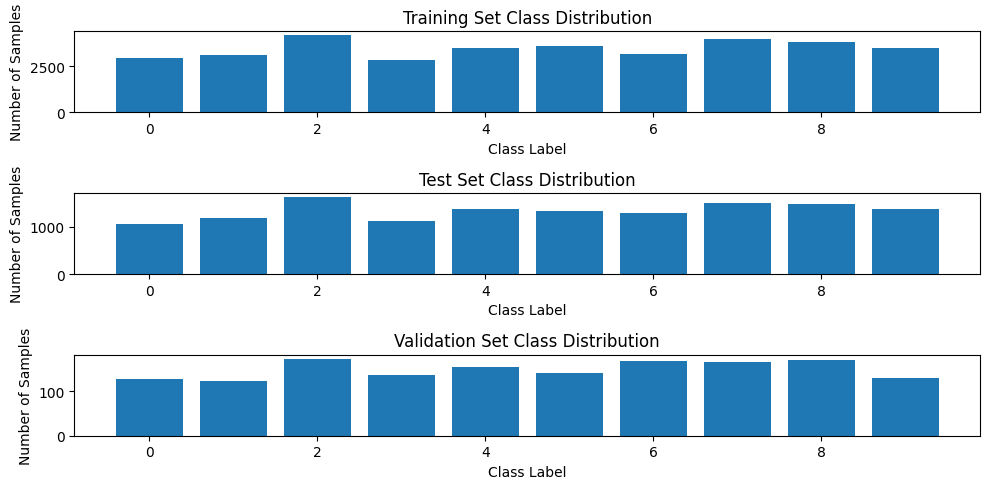

In [95]:
# Plotting
plt.figure(figsize=(10, 5))

plt.subplot(3, 1, 1)
plt.bar(train_aug_class_dict.keys(), train_aug_class_dict.values())
plt.title('Training Set Class Distribution')
plt.xlabel('Class Label')
plt.ylabel('Number of Samples')

plt.subplot(3, 1, 2)
plt.bar(test_aug_class_dict.keys(), test_aug_class_dict.values())
plt.title('Test Set Class Distribution')
plt.xlabel('Class Label')
plt.ylabel('Number of Samples')

plt.subplot(3, 1, 3)
plt.bar(val_aug_class_dict.keys(), val_aug_class_dict.values())
plt.title('Validation Set Class Distribution')
plt.xlabel('Class Label')
plt.ylabel('Number of Samples')

plt.tight_layout()
plt.show()

In [96]:
epochs=10,
classes=10,
batch_size=32,
lr=0.001,

In [98]:
trainPath = os.path.join(Path,"train_aug_data.xlsx") 
testPath = os.path.join(Path,"test_aug_data.xlsx")
valPath = os.path.join(Path,"val_aug_data.xlsx")

dtrain = dataloader(trainPath)
data_train = DataLoader(dtrain,batch_size=32,shuffle=True)

dtest = dataloader(testPath)
data_test = DataLoader(dtest,batch_size=32,shuffle=True)

dval = dataloader(valPath)
data_val = DataLoader(dval,batch_size=32,shuffle=False)


In [99]:
wandb.init(project="CV_assignment_dataAug",name="1_q4_datAug")

In [104]:
for epoch in tqdm(range(epochs[0])):
    pretrained_model.train()
    train_loss_epoch = 0.0
    train_correct = 0
    
    i=0
    for batch in data_train:
        optimizer.zero_grad()
        images, labels = batch 

        outputs, loss , images , labels = get_output(pretrained_model,images,labels)         
        loss.backward()
        optimizer.step()
        i += 1
        train_loss_epoch += loss.item() / batch_size[0]
        _, predicted = torch.max(outputs, 1)
        train_correct += (predicted == labels).sum().item()
    
    # Calculate average training loss and accuracy
    l = len(dtrain)
    train_loss , train_accuracy = get_loss_accuracy(train_loss_epoch,train_correct,l)
    
    # Validation loop
    pretrained_model = pretrained_model.eval()
    val_loss = 0.0
    vald_correct = 0
    
    with torch.no_grad():
        iv = 0 
        for batch in data_val : 
            img_v , label_v = batch 
            
            output_val , img_v , label_v = get_output(pretrained_model,img_v,label_v,to_test=True)
            iv += 1
            val_loss += loss.item() / batch_size[0]
            _, predicted = torch.max(output_val, 1)
            predicted_dv = predicted.to(device)
            vald_correct += (predicted_dv == label_v).sum().item()
    
    l_v = len(dval)
    val_loss , val_accuracy = get_loss_accuracy(val_loss,vald_correct,l_v)
    
    # Log training and validation metrics to WandB
    wandb.log({
    'epoch': epoch + 1,
    'train_loss': train_loss_epoch,
    'train_accuracy': train_accuracy,
    'val_loss': val_loss,
    'val_accuracy': val_accuracy
})
    
    # Print training and validation metrics
    print(f"Epoch : {epoch} | Train loss : {train_loss_epoch:.3f} | Train Acc : {train_accuracy:.3f} | Val acc. {val_accuracy:.2f}")

torch.save(pretrained_model.state_dict(), os.path.join("/home/vijay/Dataset/aditya_test",f"4_aug_.pkl"))


 10%|█         | 1/10 [00:41<06:11, 41.22s/it]

Epoch : 0 | Train loss : 35.644 | Train Acc : 65.043 | Val acc. 70.04


 20%|██        | 2/10 [01:19<05:17, 39.75s/it]

Epoch : 1 | Train loss : 27.663 | Train Acc : 72.107 | Val acc. 72.40


 30%|███       | 3/10 [01:58<04:34, 39.15s/it]

Epoch : 2 | Train loss : 26.377 | Train Acc : 73.215 | Val acc. 73.89


 40%|████      | 4/10 [02:36<03:51, 38.65s/it]

Epoch : 3 | Train loss : 25.614 | Train Acc : 73.819 | Val acc. 74.56


 50%|█████     | 5/10 [03:14<03:12, 38.47s/it]

Epoch : 4 | Train loss : 24.955 | Train Acc : 74.664 | Val acc. 74.63


 60%|██████    | 6/10 [03:53<02:34, 38.62s/it]

Epoch : 5 | Train loss : 24.601 | Train Acc : 74.722 | Val acc. 75.37


 70%|███████   | 7/10 [04:32<01:56, 38.89s/it]

Epoch : 6 | Train loss : 24.513 | Train Acc : 74.939 | Val acc. 75.30


 80%|████████  | 8/10 [05:10<01:17, 38.68s/it]

Epoch : 7 | Train loss : 24.119 | Train Acc : 75.500 | Val acc. 75.64


 90%|█████████ | 9/10 [05:50<00:38, 38.98s/it]

Epoch : 8 | Train loss : 23.860 | Train Acc : 75.317 | Val acc. 75.57


100%|██████████| 10/10 [06:28<00:00, 38.81s/it]

Epoch : 9 | Train loss : 23.791 | Train Acc : 75.829 | Val acc. 75.64


In [116]:
pretrained_model = models.resnet18()
pretrained_model.fc = nn.Linear(pretrained_model.fc.in_features, classes[0])
loaded_model = torch.load('/home/vijay/Dataset/aditya_test/4_aug_.pkl')
pretrained_model.load_state_dict(loaded_model)


<All keys matched successfully>

In [120]:
true_labels = []
pred_labels = []

pretrained_model = pretrained_model.to(device)
pretrained_model = pretrained_model.eval()

with torch.no_grad():
    for batch in data_test:

        images, labels = batch 
        outputs,images,labels = get_output(pretrained_model,images,labels,to_test=True)

        _, predicted = torch.max(outputs, 1)
        
        true_labels.extend(labels.cpu().numpy())
        pred_labels.extend(predicted.cpu().numpy())


# Calculate accuracy and F1-score
acc , f1 = test_log(true_labels,pred_labels)

# Print accuracy and F1-score
print(f'Test Accuracy: {acc*100:.4f}')
print(f'Test F1-Score: {f1*100:.4f}')


Test Accuracy: 77.0379
Test F1-Score: 77.1443


In [121]:
wandb.finish()

epoch,▁▂▃▃▄▅▆▆▇█
test_accuracy,▁▁▁███
test_f1_score,▁▁▁███
train_accuracy,▁▆▆▇▇▇▇███
train_loss,█▃▃▂▂▁▁▁▁▁
val_accuracy,▁▄▆▇▇█████
val_loss,▄▅▄▇▄▁▄▅█▆
epoch,10
test_accuracy,0.77038
test_f1_score,0.77144
train_accuracy,75.82945


BONUS

In [158]:
""" 
For resnet model trained on augmented data : 
"""

' \nFor resnet model : \n'

In [159]:
testPath = '/home/vijay/Dataset/aditya_test/test_data.xlsx'
dtest = dataloader(testPath)
data_test = DataLoader(dtest,batch_size=1,shuffle=True)

In [244]:
pretrained_model = models.resnet18()
pretrained_model.fc = nn.Linear(pretrained_model.fc.in_features, classes[0])
loaded_model = torch.load('/home/vijay/Dataset/aditya_test/4_aug_.pkl')
pretrained_model.load_state_dict(loaded_model)
pretrained_model = pretrained_model.eval()
pretrained_model = pretrained_model.to(device)


In [187]:
Path

'/home/vijay/Dataset/aditya_test'

In [245]:
class_feature = {key : [] for key in class_mapping.keys()}

In [246]:
class_feature

{'amur_leopard': [],
 'amur_tiger': [],
 'birds': [],
 'black_bear': [],
 'brown_bear': [],
 'dog': [],
 'roe_deer': [],
 'sika_deer': [],
 'wild_boar': [],
 'people': []}

In [247]:
cp = os.listdir(f"{Path}/data")
with torch.no_grad():
    for p in tqdm(cp) : 
        dir = f"{Path}/data/{p}"
        list = os.listdir(dir)
        
        for img in list :
            path = f"{dir}/{img}"
            img = Image.open(path).resize((224,224))
            img = transform1(img)
            label = class_mapping[p] 
            
            output,images,labels = get_output(pretrained_model,images,labels,to_test=True)
            out_np = outputs.cpu().numpy()
            class_feature[p].append(out_np)
            
        features = np.concatenate(class_feature[p])
        fm = np.mean(class_feature[p],axis=0)
        class_feature[p] = fm 
        
            


100%|██████████| 10/10 [01:40<00:00, 10.02s/it]


In [248]:
features = []
labels_f = []

with torch.no_grad() : 
    for batch in data_test : 
        images , labels = batch 
        outputs,images,labels = get_output(pretrained_model,images,labels,to_test=True)
        out_np = outputs.cpu().numpy()
        label_np = labels.cpu().numpy()
        # features.extend(out_np)
        # labels_f.extend(label_np)
        features.append(out_np)
        labels_f.append(label_np)
        

features = np.concatenate(features)
features.shape

(3334, 10)

In [249]:
class_miss = {key: 0 for key in class_mapping.values()}

In [250]:

with torch.no_grad():
    for batch in data_test : 
        img_v , label_v = batch 
        output_val , img_v , label_v = get_output(pretrained_model,img_v,label_v,to_test=True)
        _, predicted = torch.max(output_val, 1)
        predicted_dv = predicted.to(device)
        
        if(label_v != predicted and class_miss[label_v.item()] !=3) : 
            class_miss[label_v.item()] +=1
            euclidean_distance = np.linalg.norm(output_val.cpu() - class_feature[p])
            print(f"True class : {label_v[0]} | Predicted class : {predicted[0]} | Euclidean Distance : {euclidean_distance}")
        
        miss = class_miss.values()
        m = sum(miss)
        if(m == 30):
            break 

True class : 3 | Predicted class : 4 | Euclidean Distance : 9.510709762573242
True class : 4 | Predicted class : 3 | Euclidean Distance : 9.612300872802734
True class : 1 | Predicted class : 6 | Euclidean Distance : 10.192978858947754
True class : 6 | Predicted class : 7 | Euclidean Distance : 6.827943325042725
True class : 3 | Predicted class : 4 | Euclidean Distance : 5.6907548904418945
True class : 2 | Predicted class : 5 | Euclidean Distance : 14.762918472290039
True class : 2 | Predicted class : 9 | Euclidean Distance : 12.858320236206055
True class : 5 | Predicted class : 4 | Euclidean Distance : 6.6757941246032715
True class : 5 | Predicted class : 0 | Euclidean Distance : 12.00147533416748
True class : 2 | Predicted class : 6 | Euclidean Distance : 8.511661529541016
True class : 3 | Predicted class : 6 | Euclidean Distance : 9.673066139221191
True class : 4 | Predicted class : 3 | Euclidean Distance : 11.033934593200684
True class : 6 | Predicted class : 8 | Euclidean Distance 

In [275]:
""" 
For cnn model : 
"""

' \nFor cnn model : \n'

In [280]:
class CNN(nn.Module):
    def __init__(self, num_classes):
        super(CNN, self).__init__()
        
        # Convolutional layers
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1)
        
        # Max pooling layers
        self.maxpool1 = nn.MaxPool2d(kernel_size=4, stride=4)
        self.maxpool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        
        # Fully connected layer
        self.fc = nn.Linear(128 * 14 * 14, num_classes)  # Assuming input image size 224x224
        
        # Activation function
        self.relu = nn.ReLU()
        
    def forward(self, x):
        # Convolutional layers with ReLU activation
        x = self.relu(self.conv1(x))
        x = self.maxpool1(x)
        
        x = self.relu(self.conv2(x))
        x = self.maxpool2(x)
        
        x = self.relu(self.conv3(x))
        x = self.maxpool2(x)
        
        # Flatten the output
        x = x.view(x.size(0), -1)
        
        # Fully connected layer
        x = self.fc(x)        
        return x


In [281]:
cnn = CNN(10)
loaded_model = torch.load('/home/vijay/Dataset/aditya_test/2_.pkl')
cnn.load_state_dict(loaded_model)
cnn = cnn.eval()
cnn = cnn.to(device)


In [282]:
class_miss = {key: 0 for key in class_mapping.values()}

In [283]:
with torch.no_grad():
    for batch in data_test : 
        img_v , label_v = batch 
        output_val , img_v , label_v = get_output(cnn,img_v,label_v,to_test=True)
        _, predicted = torch.max(output_val, 1)
        predicted_dv = predicted.to(device)
        
        if(label_v != predicted and class_miss[label_v.item()] !=3) : 
            class_miss[label_v.item()] +=1
            euclidean_distance = np.linalg.norm(output_val.cpu() - class_feature[p])
            print(f"True class : {label_v[0]} | Predicted class : {predicted[0]} | Euclidean Distance : {euclidean_distance}")
        
        miss = class_miss.values()
        m = sum(miss)
        if(m == 30):
            break 

True class : 1 | Predicted class : 0 | Euclidean Distance : 38.34449768066406
True class : 7 | Predicted class : 6 | Euclidean Distance : 47.652523040771484
True class : 2 | Predicted class : 4 | Euclidean Distance : 10.348711967468262
True class : 1 | Predicted class : 7 | Euclidean Distance : 17.39586067199707
True class : 6 | Predicted class : 1 | Euclidean Distance : 11.211783409118652
True class : 2 | Predicted class : 9 | Euclidean Distance : 29.04446792602539
True class : 4 | Predicted class : 3 | Euclidean Distance : 79.87519836425781
True class : 1 | Predicted class : 7 | Euclidean Distance : 35.29945373535156
True class : 9 | Predicted class : 2 | Euclidean Distance : 42.56366729736328
True class : 6 | Predicted class : 5 | Euclidean Distance : 24.574419021606445
True class : 9 | Predicted class : 8 | Euclidean Distance : 44.31101608276367
True class : 5 | Predicted class : 2 | Euclidean Distance : 53.4626579284668
True class : 7 | Predicted class : 9 | Euclidean Distance : 1

In [271]:
"""
For Resnet18 model : 
"""

'\nFor Resnet18 model : \n'

In [272]:
model = models.resnet18()
model.fc = nn.Linear(model.fc.in_features, classes[0])
loaded_model = torch.load('/home/vijay/Dataset/aditya_test/3_.pkl')
model.load_state_dict(loaded_model)
model = model.eval()
model = model.to(device)


In [273]:
class_miss = {key: 0 for key in class_mapping.values()}

In [274]:
with torch.no_grad():
    for batch in data_test : 
        img_v , label_v = batch 
        output_val , img_v , label_v = get_output(cnn_model,img_v,label_v,to_test=True)
        _, predicted = torch.max(output_val, 1)
        predicted_dv = predicted.to(device)
        
        if(label_v != predicted and class_miss[label_v.item()] !=3) : 
            class_miss[label_v.item()] +=1
            euclidean_distance = np.linalg.norm(output_val.cpu() - class_feature[p])
            print(f"True class : {label_v[0]} | Predicted class : {predicted[0]} | Euclidean Distance : {euclidean_distance}")
        
        miss = class_miss.values()
        m = sum(miss)
        if(m == 30):
            break 

True class : 0 | Predicted class : 2 | Euclidean Distance : 13.99483871459961
True class : 5 | Predicted class : 2 | Euclidean Distance : 13.99283504486084
True class : 9 | Predicted class : 2 | Euclidean Distance : 13.984682083129883
True class : 0 | Predicted class : 2 | Euclidean Distance : 13.99399471282959
True class : 4 | Predicted class : 2 | Euclidean Distance : 14.01704216003418
True class : 9 | Predicted class : 6 | Euclidean Distance : 13.990453720092773
True class : 4 | Predicted class : 2 | Euclidean Distance : 13.99814510345459
True class : 9 | Predicted class : 6 | Euclidean Distance : 13.955217361450195
True class : 2 | Predicted class : 1 | Euclidean Distance : 13.974799156188965
True class : 7 | Predicted class : 2 | Euclidean Distance : 14.001065254211426
True class : 5 | Predicted class : 0 | Euclidean Distance : 13.988438606262207
True class : 1 | Predicted class : 2 | Euclidean Distance : 14.001882553100586
True class : 4 | Predicted class : 2 | Euclidean Distance